In [8]:
## EDA pkgs
import pandas as pd


In [9]:
## Data Viz pkg
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
%matplotlib inline

In [10]:
#hide warnings
import warnings
warnings.filterwarnings('ignore')

In [11]:
#load Dataset
df = pd.read_csv("F:\DREAMWEAVER\python\data/covid19_tweets.csv")

In [12]:
#preview
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False


#Task

+ Text
    - Text preprocessing
    - Sentiment Analysis
    - Keyword Extraction
    - Predictive Analysis

In [13]:
# check columns
df.columns

Index(['user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'is_retweet'],
      dtype='object')

In [14]:
# Dataype
df.dtypes

user_name           object
user_location       object
user_description    object
user_created        object
user_followers       int64
user_friends         int64
user_favourites      int64
user_verified         bool
date                object
text                object
hashtags            object
source              object
is_retweet            bool
dtype: object

In [15]:
# Source/ Value Count / Distribution of Sources
df['source'].unique()

array(['Twitter for iPhone', 'Twitter for Android', 'Twitter Web App',
       'Buffer', 'TweetDeck', 'Twitter for iPad', 'Africa Newsroom',
       'Blood Donors India', 'TweetCaster for Android',
       'Alexander Higgins', 'IFTTT', 'Hootsuite Inc.', 'Sprout Social',
       'Sprinklr', 'assarofficial', 'IAMBLOG2TWITTER', 'CrowdControlHQ',
       'COVID19-Updates', 'EveryoneSocial', 'Dynamic Signal', 'Instagram',
       'TweetCaster for iOS', 'GlobalPandemic.NET', 'Venrap Radio',
       'HeyOrca', 'Twitter for Advertisers', 'Paper.li',
       'Twitter Media Studio', 'Twitter for Mac', 'dlvr.it',
       'Cheap Bots, Done Quick!', 'Prof. Shanku', 'LaterMedia',
       'SEMrush Social Media Tool', 'Twitterrific for iOS',
       "Sebastian's Twitter Bot", 'Threader_client', 'COVID19FactoidBot',
       'PwC UK SMART', 'tweet pro stiff', 'UK COVID-19 Alerts',
       'Resistbot Open Letters', 'preprint-alert', 'ContentStudio.io',
       'Peeping Moon', 'TweetAutomaticos', 'Orlo', 'AgoraPulse Ma

In [16]:
# Source/ Value Count / Distribution of Sources
df['source'].value_counts()

Twitter Web App                     56891
Twitter for Android                 40179
Twitter for iPhone                  35472
TweetDeck                            8543
Hootsuite Inc.                       7321
                                    ...  
CoronaTrackerMY                         1
Choqok                                  1
Conservative Daily News                 1
Partisan Issues?                        1
Blackbird Video Platform/Amplify        1
Name: source, Length: 610, dtype: int64

In [17]:
# Plot the top value_counts
df['source'].value_counts().nlargest(30)

Twitter Web App            56891
Twitter for Android        40179
Twitter for iPhone         35472
TweetDeck                   8543
Hootsuite Inc.              7321
Twitter for iPad            4336
Buffer                      2728
Sprout Social               1833
Instagram                   1759
IFTTT                       1545
dlvr.it                      681
GlobalPandemic.NET           679
LinkedIn                     628
COVID19-Updates              625
Twitter Media Studio         596
WordPress.com                537
HubSpot                      513
Sprinklr                     497
FS Poster                    414
Dynamic Signal               391
Resistbot Open Letters       390
Cheap Bots, Done Quick!      335
Paper.li                     322
Twitter for Advertisers      317
Blood Donors India           281
IAMBLOG2TWITTER              266
Alexander Higgins            225
Zoho Social                  224
The Social Jukebox           216
Fabrik.fm                    209
Name: sour

<AxesSubplot:>

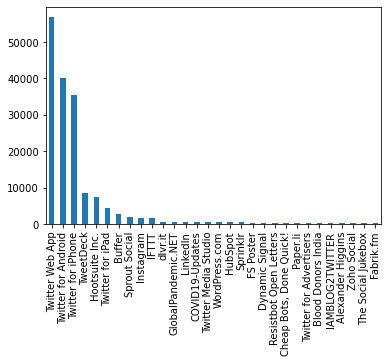

In [18]:
# Plot the top value_counts
df['source'].value_counts().nlargest(30).plot(kind='bar')

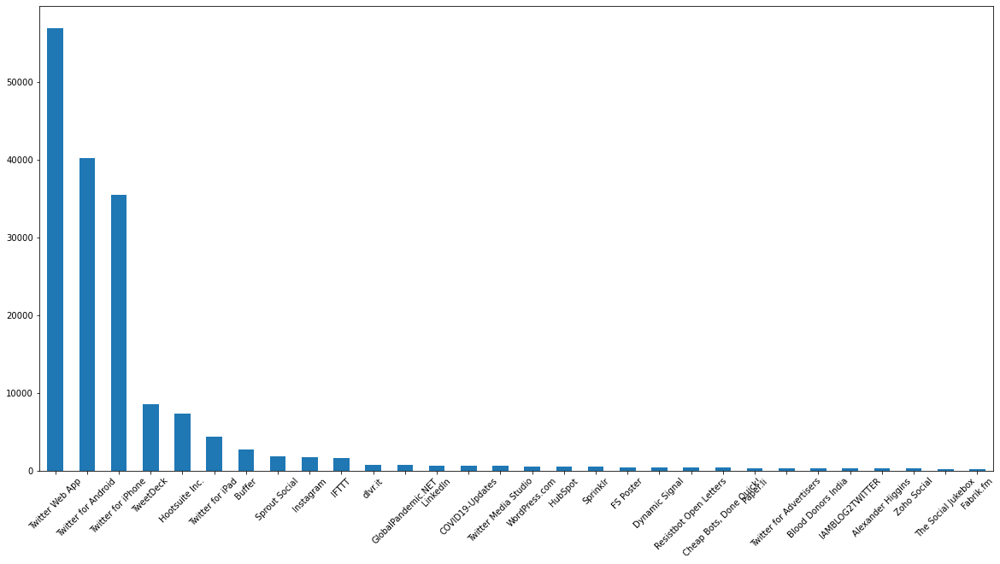

In [19]:
#plot the top value counts
plt.figure(figsize=(20,10))
df['source'].value_counts().nlargest(30).plot(kind='bar')
plt.xticks(rotation=45)
plt.show()

## Text Analysis of tweets

In [20]:
#load text cleaning package
import neattext.functions as nfx

In [21]:
dir(nfx)

['BTC_ADDRESS_REGEX',
 'CURRENCY_REGEX',
 'CURRENCY_SYMB_REGEX',
 'Counter',
 'DATE_REGEX',
 'EMAIL_REGEX',
 'EMOJI_REGEX',
 'HASTAG_REGEX',
 'MASTERCard_REGEX',
 'MD5_SHA_REGEX',
 'MOST_COMMON_PUNCT_REGEX',
 'NUMBERS_REGEX',
 'PHONE_REGEX',
 'PoBOX_REGEX',
 'SPECIAL_CHARACTERS_REGEX',
 'STOPWORDS',
 'STOPWORDS_de',
 'STOPWORDS_en',
 'STOPWORDS_es',
 'STOPWORDS_fr',
 'STOPWORDS_ru',
 'STOPWORDS_yo',
 'STREET_ADDRESS_REGEX',
 'TextFrame',
 'URL_PATTERN',
 'USER_HANDLES_REGEX',
 'VISACard_REGEX',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__generate_text',
 '__loader__',
 '__name__',
 '__numbers_dict',
 '__package__',
 '__spec__',
 '_lex_richness_herdan',
 '_lex_richness_maas_ttr',
 'clean_text',
 'defaultdict',
 'digit2words',
 'extract_btc_address',
 'extract_currencies',
 'extract_currency_symbols',
 'extract_dates',
 'extract_emails',
 'extract_emojis',
 'extract_hashtags',
 'extract_html_tags',
 'extract_mastercard_addr',
 'extract_md5sha',
 'extract_numbers',
 'extr

In [22]:
df['text']

0         If I smelled the scent of hand sanitizers toda...
1         Hey @Yankees @YankeesPR and @MLB - wouldn't it...
2         @diane3443 @wdunlap @realDonaldTrump Trump nev...
3         @brookbanktv The one gift #COVID19 has give me...
4         25 July : Media Bulletin on Novel #CoronaVirus...
                                ...                        
179103    Thanks @IamOhmai for nominating me for the @WH...
179104    2020! The year of insanity! Lol! #COVID19 http...
179105    @CTVNews A powerful painting by Juan Lucena. I...
179106    More than 1,200 students test positive for #CO...
179107    I stop when I see a Stop\n\n@SABCNews\n@Izinda...
Name: text, Length: 179108, dtype: object

+ Noise
    - remove mentions/userhandles
    - remove hashtags
    - urls
    - emojis
    - special char

In [21]:
# df.head() to check column name for hastags

In [23]:
df['text'].apply(nfx.extract_hashtags)

0                                      []
1                                      []
2                              [#COVID19]
3                              [#COVID19]
4         [#CoronaVirusUpdates, #COVID19]
                       ...               
179103                       [#WearAMask]
179104                         [#COVID19]
179105                                 []
179106                         [#COVID19]
179107                                 []
Name: text, Length: 179108, dtype: object

In [24]:
df['extracted_hashtags'] =df['text'].apply(nfx.extract_hashtags)

In [25]:
df[['extracted_hashtags','hashtags']]

,extracted_hashtags,hashtags
0,[],NaN
1,[],NaN
2,[#COVID19],['COVID19']
3,[#COVID19],['COVID19']
4,"[#CoronaVirusUpdates, #COVID19]","['CoronaVirusUpdates', 'COVID19']"
...,...,...
179103,[#WearAMask],['WearAMask']
179104,[#COVID19],['COVID19']
179105,[],NaN
179106,[#COVID19],['COVID19']


In [26]:
#cleaning text hashtags
df['clean_tweet']= df['text'].apply(nfx.remove_hashtags)

In [27]:
df[['text','clean_tweet']]

,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey @Yankees @YankeesPR and @MLB - wouldn't it...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,@diane3443 @wdunlap @realDonaldTrump Trump nev...
3,@brookbanktv The one gift #COVID19 has give me...,@brookbanktv The one gift has give me is an ...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel \n@kansa...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks @IamOhmai for nominating me for the @WH...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020! The year of insanity! Lol! https://t.c...
179105,@CTVNews A powerful painting by Juan Lucena. I...,@CTVNews A powerful painting by Juan Lucena. I...
179106,"More than 1,200 students test positive for #CO...","More than 1,200 students test positive for a..."


In [28]:
#remove userhandles
df['clean_tweet'] = df['clean_tweet'].apply(lambda x: nfx.remove_userhandles(x))

In [29]:
df[['text','clean_tweet']]

,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey and - wouldn't it have made more sen...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,Trump never once claimed was a hoax. W...
3,@brookbanktv The one gift #COVID19 has give me...,The one gift has give me is an appreciatio...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel \n ...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks for nominating me for the challen...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020! The year of insanity! Lol! https://t.c...
179105,@CTVNews A powerful painting by Juan Lucena. I...,A powerful painting by Juan Lucena. It's a t...
179106,"More than 1,200 students test positive for #CO...","More than 1,200 students test positive for a..."


In [30]:
df['clean_tweet'].iloc[10]

'49K+ Covid19 cases still no response from \n      cancel the compartment exa… https://t.co/kV2ZKmumu1'

In [31]:
#cleaning text multiple spaces
df['clean_tweet']= df['clean_tweet'].apply(nfx.remove_multiple_spaces)

In [32]:
df['clean_tweet'].iloc[10]

'49K+ Covid19 cases still no response from cancel the compartment exa… https://t.co/kV2ZKmumu1'

In [33]:
#cleaning text urls
df['clean_tweet']= df['clean_tweet'].apply(nfx.remove_urls)

In [34]:
df['clean_tweet'].iloc[10]

'49K+ Covid19 cases still no response from cancel the compartment exa… '

In [35]:
#cleaning text punctuations
df['clean_tweet']= df['clean_tweet'].apply(nfx.remove_puncts)

In [36]:
df['clean_tweet'].iloc[10]

'49K+ Covid19 cases still no response from cancel the compartment exa… '

In [37]:
df[['text','clean_tweet']]

,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey and wouldnt it have made more sense to ha...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,Trump never once claimed was a hoax We all cl...
3,@brookbanktv The one gift #COVID19 has give me...,The one gift has give me is an appreciation f...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks for nominating me for the challenge I n...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020 The year of insanity Lol
179105,@CTVNews A powerful painting by Juan Lucena. I...,A powerful painting by Juan Lucena Its a trib...
179106,"More than 1,200 students test positive for #CO...",More than 1200 students test positive for at m...


### SEntiment Analysis

In [38]:
from textblob import TextBlob

In [39]:
def get_sentiment(text):
    blob = TextBlob(text)
    sentiment_polarity= blob.sentiment.polarity
    sentiment_subjectivity= blob.sentiment.subjectivity
    if sentiment_polarity > 0:
        sentiment_label = 'Positive'
    elif sentiment_polarity < 0:
        sentiment_label ='Negative'
    else:
        sentiment_label = 'Neutral'
    result= {'polarity':sentiment_polarity,
             'subjectivity':sentiment_subjectivity,
            'sentiment':sentiment_label}
    return result

In [40]:
#text
ex1= df['clean_tweet'].iloc[0]

In [41]:
get_sentiment(ex1)

{'polarity': -0.25, 'subjectivity': 0.25, 'sentiment': 'Negative'}

In [42]:
df['sentiment_results'] = df['clean_tweet'].apply(get_sentiment)

In [43]:
df['sentiment_results']

0         {'polarity': -0.25, 'subjectivity': 0.25, 'sen...
1         {'polarity': 0.5, 'subjectivity': 0.5, 'sentim...
2         {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
3         {'polarity': 0.0, 'subjectivity': 0.3571428571...
4         {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
                                ...                        
179103    {'polarity': 0.2, 'subjectivity': 0.2, 'sentim...
179104    {'polarity': 0.8, 'subjectivity': 0.7, 'sentim...
179105    {'polarity': 0.3, 'subjectivity': 1.0, 'sentim...
179106    {'polarity': 0.26325757575757575, 'subjectivit...
179107    {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
Name: sentiment_results, Length: 179108, dtype: object

In [44]:
df['sentiment_results'].iloc[0]

{'polarity': -0.25, 'subjectivity': 0.25, 'sentiment': 'Negative'}

In [45]:
# break the polarity, subjectivity and sentiment into columns
pd.json_normalize(df['sentiment_results'].iloc[0])

,polarity,subjectivity,sentiment
0,-0.25,0.25,Negative


In [46]:
#for whole table
df = df.join(pd.json_normalize(df['sentiment_results']))

In [47]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,extracted_hashtags,clean_tweet,sentiment_results,polarity,subjectivity,sentiment
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False,[],If I smelled the scent of hand sanitizers toda...,"{'polarity': -0.25, 'subjectivity': 0.25, 'sen...",-0.25,0.250000,Negative
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,[],Hey and wouldnt it have made more sense to ha...,"{'polarity': 0.5, 'subjectivity': 0.5, 'sentim...",0.50,0.500000,Positive
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False,[#COVID19],Trump never once claimed was a hoax We all cl...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False,[#COVID19],The one gift has give me is an appreciation f...,"{'polarity': 0.0, 'subjectivity': 0.3571428571...",0.00,0.357143,Neutral
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False,"[#CoronaVirusUpdates, #COVID19]",25 July : Media Bulletin on Novel,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral


In [48]:
df['sentiment'].value_counts()

Neutral     75490
Positive    74154
Negative    29464
Name: sentiment, dtype: int64

<AxesSubplot:>

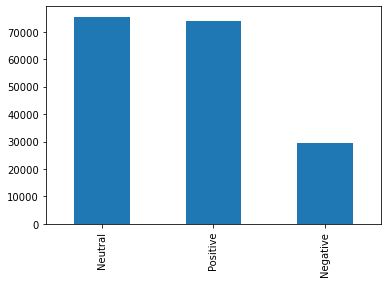

In [49]:
df['sentiment'].value_counts().plot(kind='bar')

<AxesSubplot:xlabel='sentiment', ylabel='count'>

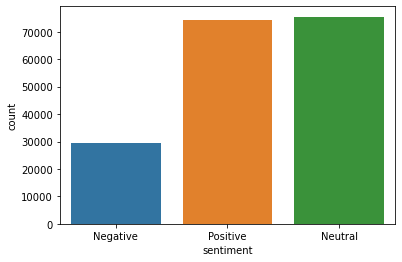

In [50]:
# Plot with seaborn
sns.countplot(df['sentiment'])

### keyword extraction
+abs for positive and negative sentiment
+ general

In [51]:
positive_tweet = df[df['sentiment']== 'Positive']['clean_tweet']

In [52]:
neutral_tweet = df[df['sentiment']== 'Neutral']['clean_tweet']

In [53]:
negative_tweet = df[df['sentiment']== 'Negative']['clean_tweet']

In [54]:
negative_tweet

0         If I smelled the scent of hand sanitizers toda...
5          deaths continue to rise Its almost as bad as ...
22         Your image doesnt list a source but Id be car...
36         Im feeling a little anxious because seems to ...
41        Britain didnt understand for months while plen...
                                ...                        
179067    60k + dead due to inaction on 20k + residents ...
179078      Nigeria: The dedicated few protecting childr...
179085    How toilet paper and avocados help explain the...
179086    Widened small blood vessels in the lungs appea...
179088    As a result of the pandemic hundreds if not th...
Name: clean_tweet, Length: 29464, dtype: object

In [55]:
# remove stopwords and convert to tokens
positive_tweet_list = positive_tweet.apply(nfx.remove_stopwords).tolist()

In [56]:
neutral_tweet_list = neutral_tweet.apply(nfx.remove_stopwords).tolist()

In [57]:
negative_tweet_list = negative_tweet.apply(nfx.remove_stopwords).tolist()


In [58]:
negative_tweet_list

['smelled scent hand sanitizers today past think intoxicated that…',
 'deaths continue rise bad Politicians businesses want…',
 'image doesnt list source Id careful overall risk dying statistics related to…',
 'Im feeling little anxious detracted everyones…',
 'Britain didnt understand months plenty countries understand took effective…',
 'Crazy world come Americans fight this🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸',
 'sir mom ICU COVID want prayers listening',
 'aka Ill sending 500 people like amp retweet $300 $1500 Cas…',
 'time spike cases isvery hard reverse drastic lockdown time y…',
 'Hi long time preparation reopening homework',
 'OK Im angry believe stupidity virus kills must…',
 'weekend Yall pity year facing cant person…',
 'Shout Earth Hands worst reaction “emergency” I’ve seen Lottery shut and…',
 'Egyptians aint got shit',
 'Yes evidence increased Plus early guidance global PPE shortage priority to…',
 'Cum Check Ill DM Nudes',
 'worst type spread',
 'Agreed 💯% mean exactly problem travellers ❤️ needs

In [59]:
# tokenization
for line in positive_tweet_list:
   # print(line)
    for token in line.split():
        print (token)


Hey
wouldnt
sense
players
pay
respects
A…
Change
Work
General
(and
recruiting
specifically)
via/
Praying
good
health
recovery
👋🏻
—
safe
safe
commit
ensure…
Lets
protect
real
numbers
climbing
fast
Continent
Lets
n…
Second
wave
Flandersback
COVID
Update:
infection
rate
Florida
following
natural
curve
experts
predicted
initial
cu…
Good
Patriots
Volunteer
Election
Judge
Polls
open
without…
comprehensive
review
amp
Analysis:
key
ways
WASH
help
reduce
transmission…
crosses
2
lakh
mark
150055
ppp
recovered
far
positive
today
6988/total…
Actor
father
MrGKReddy
tested
positive
15/20
days
s…
safe
place
visit
guests
said
hotel
meticulous
applying
hand
sanitation
als…
CEO
live
WSU
talking
“The
effects
Covid19
students”…
Actionables
healthy
recovery
understood
hadnt
missed
meeting
In…
released
new
podcast
episodes
week:
Technology
Platforms
Conduct
Telehealth
Visits
C…
reports
1142
positive
cases
29
deaths
Saturday
Death
toll
rises
3806
reports
ANI
quot…
Venezuelas
Economy/Budget
tied
Oil
like
Loui

In [60]:
pos_tokens=[token for line in positive_tweet_list for token in line.split()]

In [61]:
neg_tokens=[token for line in negative_tweet_list for token in line.split()]

In [62]:
neut_tokens=[token for line in neutral_tweet_list for token in line.split()]

In [63]:
neg_tokens

['smelled',
 'scent',
 'hand',
 'sanitizers',
 'today',
 'past',
 'think',
 'intoxicated',
 'that…',
 'deaths',
 'continue',
 'rise',
 'bad',
 'Politicians',
 'businesses',
 'want…',
 'image',
 'doesnt',
 'list',
 'source',
 'Id',
 'careful',
 'overall',
 'risk',
 'dying',
 'statistics',
 'related',
 'to…',
 'Im',
 'feeling',
 'little',
 'anxious',
 'detracted',
 'everyones…',
 'Britain',
 'didnt',
 'understand',
 'months',
 'plenty',
 'countries',
 'understand',
 'took',
 'effective…',
 'Crazy',
 'world',
 'come',
 'Americans',
 'fight',
 'this🇺🇸🇺🇸🇺🇸🇺🇸🇺🇸',
 'sir',
 'mom',
 'ICU',
 'COVID',
 'want',
 'prayers',
 'listening',
 'aka',
 'Ill',
 'sending',
 '500',
 'people',
 'like',
 'amp',
 'retweet',
 '$300',
 '$1500',
 'Cas…',
 'time',
 'spike',
 'cases',
 'isvery',
 'hard',
 'reverse',
 'drastic',
 'lockdown',
 'time',
 'y…',
 'Hi',
 'long',
 'time',
 'preparation',
 'reopening',
 'homework',
 'OK',
 'Im',
 'angry',
 'believe',
 'stupidity',
 'virus',
 'kills',
 'must…',
 'weekend',
 

In [64]:
# get most common keywords
from collections import Counter

In [65]:
def get_tokens(docx,num=30):
    word_tokens = Counter(docx)
    most_common = word_tokens.most_common(num)
    result = dict(most_common)
    return result

In [66]:
most_common_pos_words = get_tokens(pos_tokens)
most_common_neg_words = get_tokens(neg_tokens)
most_common_neut_words = get_tokens(neut_tokens)

In [67]:
# plot seaborn
neg_df= pd.DataFrame(most_common_neg_words.items(),columns=['words','scores3'])

In [68]:
neg_df

,words,scores3
0,cases,2245
1,amp,2033
2,people,1801
3,pandemic,895
4,spread,870
5,daily,760
6,like,754
7,COVID19,748
8,slow,734
9,new,723


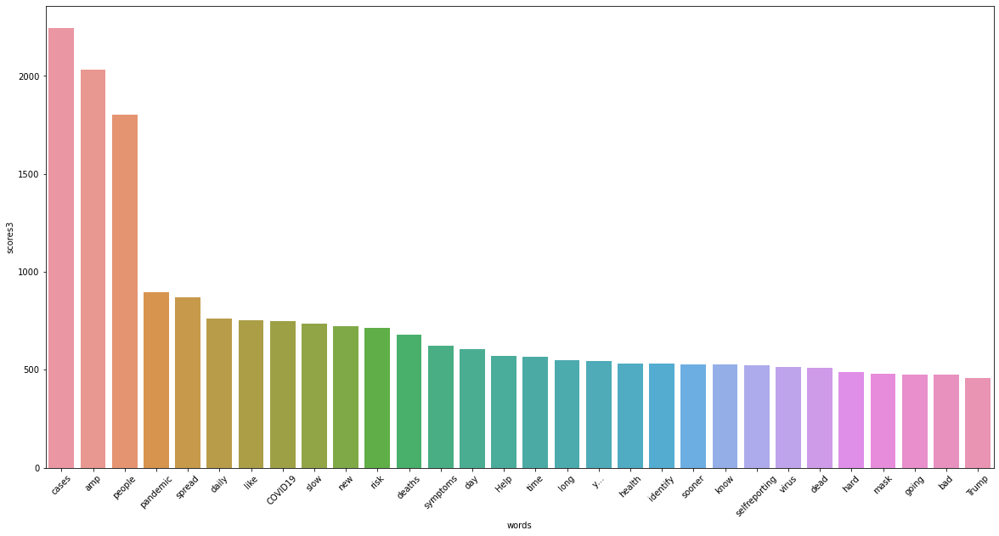

In [69]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores3',data=neg_df)
plt.xticks(rotation=45)
plt.show()

In [70]:
pos_df= pd.DataFrame(most_common_pos_words.items(),columns=['words','scores2'])

In [71]:
pos_df

,words,scores2
0,cases,10310
1,new,9947
2,amp,5298
3,positive,3888
4,people,3655
5,New,3325
6,deaths,3292
7,COVID19,2745
8,pandemic,1929
9,total,1783


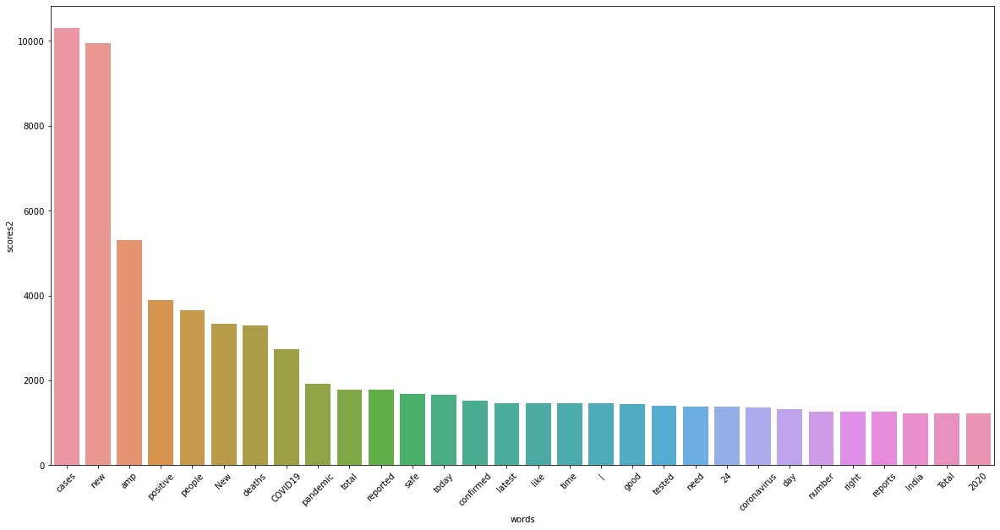

In [72]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores2',data=pos_df)
plt.xticks(rotation=45)
plt.show()

In [73]:
neut_df= pd.DataFrame(most_common_neut_words.items(),columns=['words','scores1'])

In [74]:
neut_df

,words,scores1
0,amp,4544
1,COVID19,3116
2,cases,2940
3,people,2544
4,pandemic,2110
5,|,1899
6,deaths,1868
7,:,1576
8,2020,1517
9,like,1474


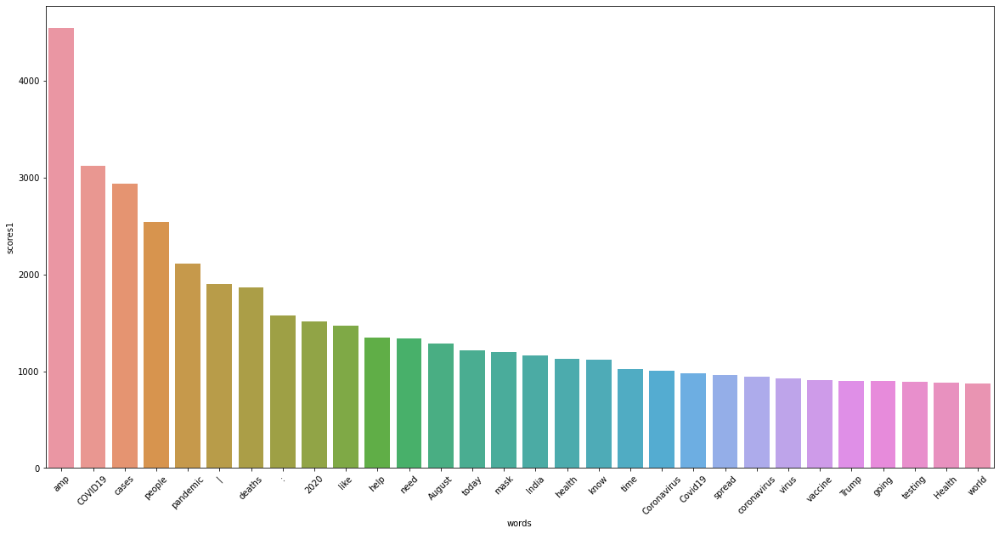

In [75]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores1',data=neut_df)
plt.xticks(rotation=45)
plt.show()

In [76]:
### Word Cloud
from wordcloud import WordCloud

In [77]:
def plot_wordcloud(docx):
    plt.figure(figsize=(20,10))
    mywordcloud = WordCloud().generate(docx)
    plt.imshow(mywordcloud,interpolation='bilinear')
    plt.axis('off')
    plt.show()

In [78]:
pos_docx= ' '.join(pos_tokens)

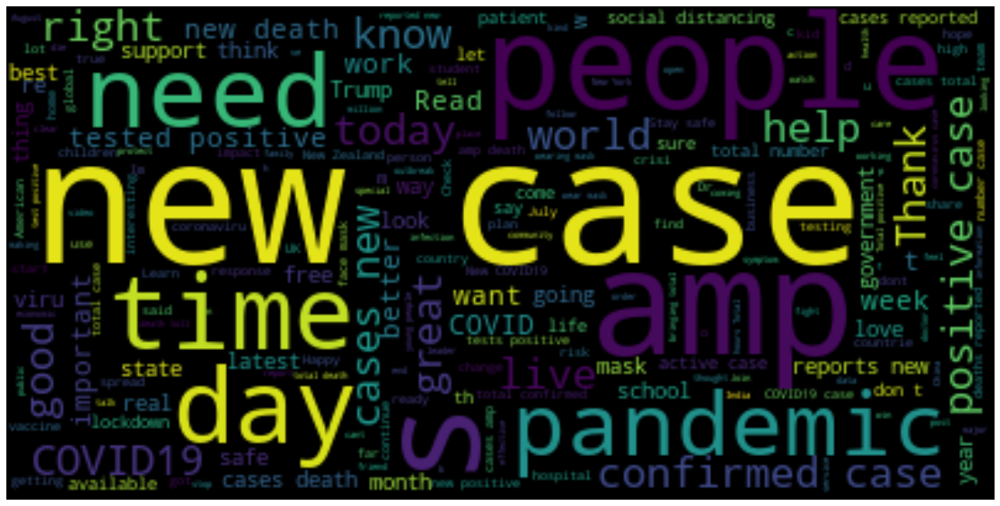

In [79]:
plot_wordcloud(pos_docx)

In [80]:
neg_docx= ' '.join(neg_tokens)

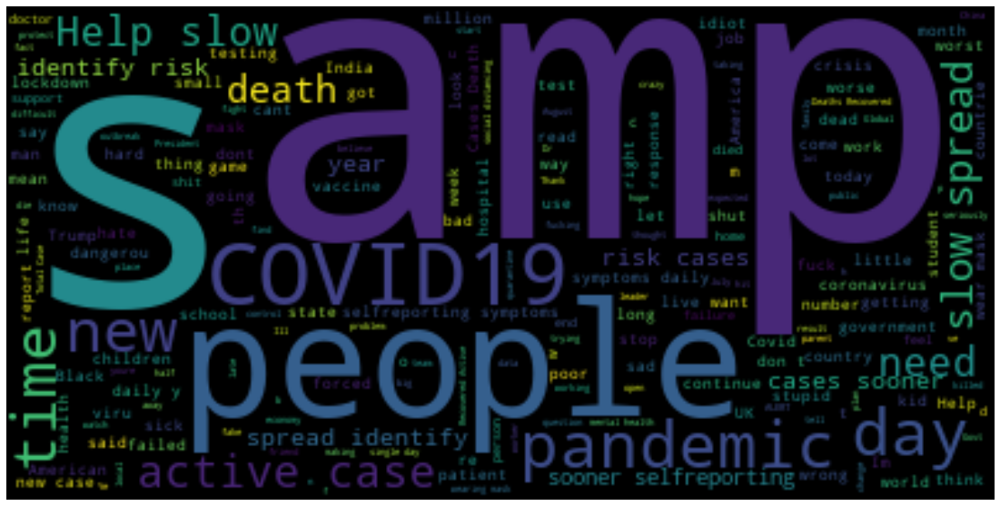

In [81]:
plot_wordcloud(neg_docx)

In [82]:
neut_docx= ' '.join(neut_tokens)

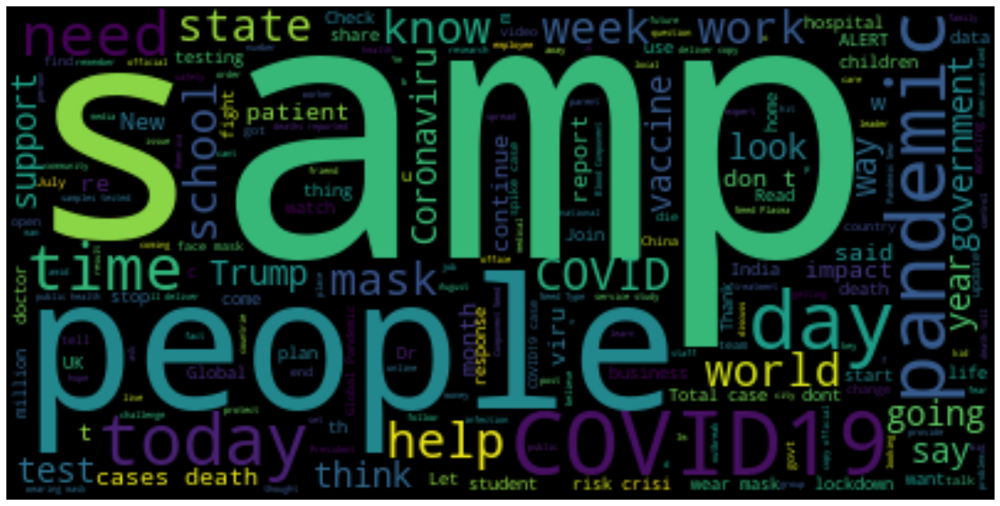

In [83]:
plot_wordcloud(neut_docx)

## Clustering

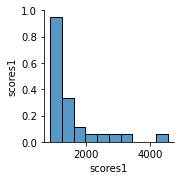

In [85]:
sns.pairplot(neut_df[['words','scores1']])

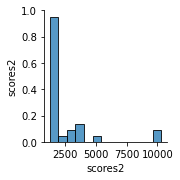

In [86]:
sns.pairplot(pos_df[['words','scores2']])

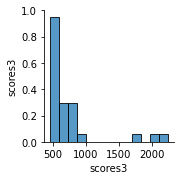

In [87]:
sns.pairplot(neg_df[['words','scores3']])

+ Data collection

In [88]:
data_clus = pd.concat([neut_df,pos_df], axis=1)
data_clus =pd.concat([data_clus, neg_df],axis=1)
data_clus.drop(["words", "words", "words"], axis = 1, inplace = True)
data_clus

,scores1,scores2,scores3
0,4544,10310,2245
1,3116,9947,2033
2,2940,5298,1801
3,2544,3888,895
4,2110,3655,870
5,1899,3325,760
6,1868,3292,754
7,1576,2745,748
8,1517,1929,734
9,1474,1783,723


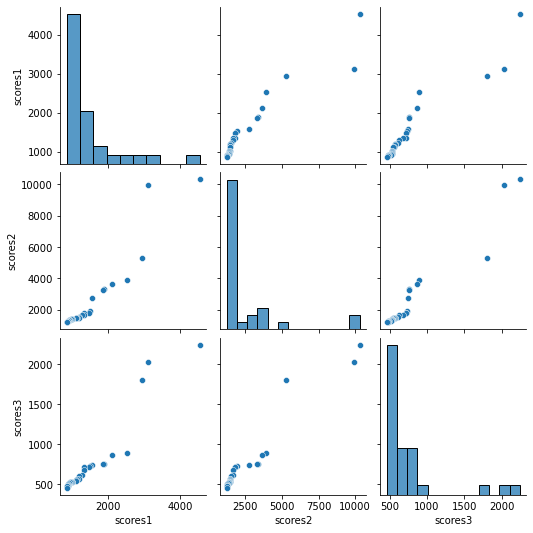

In [89]:
sns.pairplot(data_clus[['scores1','scores2','scores3']])

## Performing K-Means Clustering

In [90]:
import sklearn.cluster as cluster

In [91]:
kmeans = cluster.KMeans(n_clusters=5, init="k-means++")
kmeans = kmeans.fit(data_clus[['scores1','scores2','scores3']])

In [92]:
kmeans.cluster_centers_

array([[ 1363.83333333,  1724.16666667,   679.        ],
       [ 3830.        , 10128.5       ,  2139.        ],
       [ 1999.4       ,  3381.        ,   805.4       ],
       [  988.0625    ,  1351.5       ,   517.75      ],
       [ 2940.        ,  5298.        ,  1801.        ]])

In [93]:
data_clus['clusters']= kmeans.labels_

In [94]:
data_clus.head()

,scores1,scores2,scores3,clusters
0,4544,10310,2245,1
1,3116,9947,2033,1
2,2940,5298,1801,4
3,2544,3888,895,2
4,2110,3655,870,2


In [95]:
data_clus['clusters'].value_counts()

3    16
0     6
2     5
1     2
4     1
Name: clusters, dtype: int64

<AxesSubplot:xlabel='scores1', ylabel='scores2'>

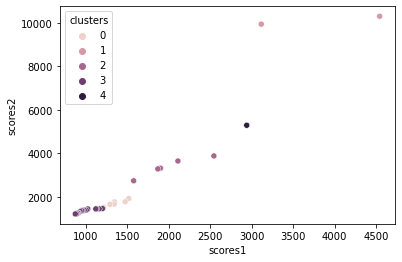

In [96]:
#neutral vs positive words
sns.scatterplot(x="scores1", y="scores2", hue='clusters',data=data_clus)

<AxesSubplot:xlabel='scores1', ylabel='scores3'>

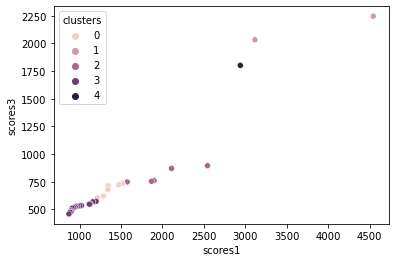

In [97]:
#neutral vs negitive words
sns.scatterplot(x="scores1", y="scores3", hue='clusters',data=data_clus)

<AxesSubplot:xlabel='scores3', ylabel='scores2'>

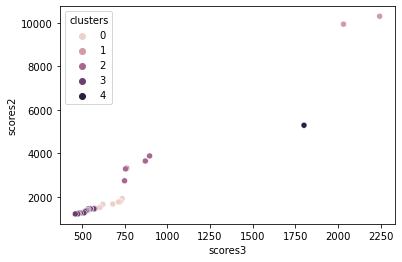

In [98]:
#negative vs positive words
sns.scatterplot(x="scores3", y="scores2", hue='clusters',data=data_clus)

### Elbow Method

In [99]:
K=range(1,12)
wss =[]
for k in K:
    kmeans=cluster.KMeans(n_clusters=k,init="k-means++")
    kmeans=kmeans.fit(data_clus)
    wss_iter = kmeans.inertia_
    wss.append(wss_iter)

In [100]:
#store the number of clusters along with wss scores in data frame
mycentres =pd.DataFrame({'Clusters':K,'WSS':wss})
mycentres

,Clusters,WSS
0,1,1.800383e+08
1,2,3.880183e+07
2,3,8.847401e+06
3,4,4.221701e+06
4,5,2.886015e+06
5,6,1.778066e+06
6,7,8.922113e+05
7,8,5.970664e+05
8,9,3.201407e+05
9,10,1.973851e+05


<AxesSubplot:xlabel='Clusters', ylabel='WSS'>

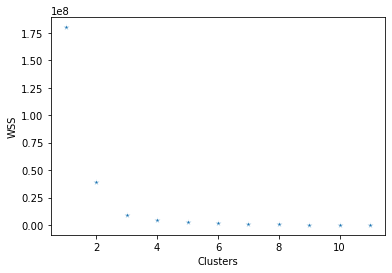

In [101]:
sns.scatterplot(x='Clusters', y='WSS', data=mycentres, marker="*")

### Silhouette Method

In [102]:
import sklearn.metrics as metrics

In [103]:
for i in range(2,13):
    labels=cluster.KMeans(n_clusters=i,init="k-means++",random_state=200).fit(data_clus).labels_
    print("Silhouette score for k(clusters) = "+str(i)+" is "
          +str(metrics.silhouette_score(data_clus,labels,metric="euclidean",sample_size=1000,random_state=200)))
    

Silhouette score for k(clusters) = 2 is 0.8497826278031091
Silhouette score for k(clusters) = 3 is 0.7782898606524334
Silhouette score for k(clusters) = 4 is 0.7580152112778652
Silhouette score for k(clusters) = 5 is 0.6048895265765145
Silhouette score for k(clusters) = 6 is 0.5389761584420687
Silhouette score for k(clusters) = 7 is 0.5216648491233887
Silhouette score for k(clusters) = 8 is 0.4763919465468661
Silhouette score for k(clusters) = 9 is 0.4669338531690676
Silhouette score for k(clusters) = 10 is 0.46618924594714506
Silhouette score for k(clusters) = 11 is 0.5032581880234174
Silhouette score for k(clusters) = 12 is 0.4924897788903228


### Plotting with 2 Clusters

In [104]:
kmeans = cluster.KMeans(n_clusters=2, init="k-means++")
kmeans = kmeans.fit(data_clus[['scores1','scores2','scores3']])

In [105]:
data_clus['clusters']= kmeans.labels_

<AxesSubplot:xlabel='scores1', ylabel='scores2'>

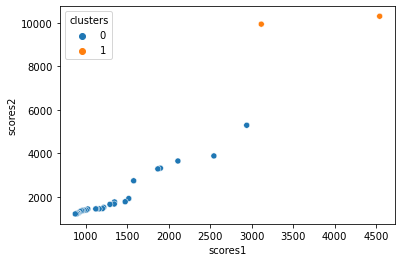

In [109]:
#neutral[scores1] vs positive[scores2] words
sns.scatterplot(x="scores1", y="scores2", hue='clusters',data=data_clus)

<AxesSubplot:xlabel='scores1', ylabel='scores3'>

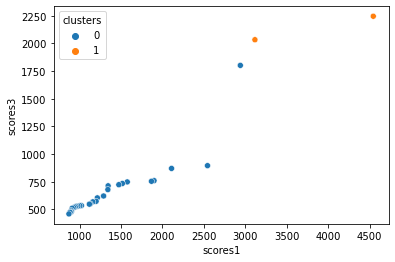

In [110]:
#neutral [scores1] vs negitive [scores3] words
sns.scatterplot(x="scores1", y="scores3", hue='clusters',data=data_clus)

<AxesSubplot:xlabel='scores2', ylabel='scores3'>

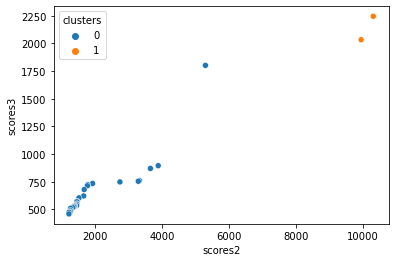

In [111]:
#negative[scores3] vs positive[scores2] words
sns.scatterplot(x="scores2", y="scores3", hue='clusters',data=data_clus)